In [1]:
!pip install evaluate rouge rouge_score huggingface-hub pycocoevalcap POT bert-score spacy timm sacrebleu
!python -m spacy download en_core_web_sm
# !pip install git+https://github.com/google-research/bleurt.git

  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 MB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.0/455.0 kB 22.0 MB/s eta 0:00:00
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=3189a5c355b2f21e6cc952b3deb768fe82282353bab6a5ee72e24f7b397fcd0a
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge_score
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 22.0 MB/s eta 0:00:00
✔ Download and in

In [2]:
from dataclasses import dataclass, field
from typing import Optional
from transformers import AutoConfig, AutoImageProcessor, AutoTokenizer, VisionEncoderDecoderModel, HfArgumentParser

In [3]:
import pandas as pd
import numpy as np
import nltk,os,evaluate,datasets
from transformers import TFVisionEncoderDecoderModel, VisionEncoderDecoderModel, AutoFeatureExtractor,AutoTokenizer, ViTImageProcessor, ViTFeatureExtractor,PreTrainedTokenizerFast
from PIL import Image
from datasets import Dataset, DatasetDict
from transformers import DataCollatorForSeq2Seq, default_data_collator, Seq2SeqTrainer, Seq2SeqTrainingArguments, logging
import wandb, torch
from tqdm import tqdm
import itertools
import gc
import io as input_output
from matplotlib import pyplot as plt
import datasets as datasets_origin
# Evaluation and metrics
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction
from scipy.stats import pearsonr
from sklearn.metrics import accuracy_score, f1_score
from textwrap import wrap
import textwrap, warnings
from huggingface_hub import login

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(f"There are {torch.cuda.device_count()} GPU(s) available.")
    print(f"We will use the GPU: {torch.cuda.get_device_name(0)}")
else:
    print("No GPU available, using the CPU instead.")

# Clear CUDA cache
torch.cuda.empty_cache()
try:
    nltk.data.find("tokenizers/punkt")
except (LookupError, OSError):
    nltk.download("punkt", quiet=True)

# OR to suppress all warnings (use with caution)
warnings.filterwarnings("ignore")
logging.set_verbosity_warning()
login(token="your_token")
wandb.login(key="your_token")

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.


There are 1 GPU(s) available.
We will use the GPU: Tesla P100-PCIE-16GB
The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: fineGrained).
Your token has been saved to /root/.cache/huggingface/token
Login successful


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [4]:
#os.environ["CUDA_VISIBLE_DEVICES"]="4"
os.environ["WANDB_PROJECT"]="vit-gpt"
os.environ["TOKENIZERS_PARALLELISM"]="true"
DATADIR = '/kaggle/input/rocov2-test/'
EPOCHS = 4
BATCH_SIZE = 4
IMG_SIZE = 224
SAMPLE_FRAC = None

In [5]:
# df_train = pd.read_csv(f"{DATADIR}train_captions.csv")
# df_val = pd.read_csv(f"{DATADIR}valid_captions.csv")
# df_test = pd.read_csv(f"{DATADIR}test_captions.csv")

# df_train['Images'] = df_train['ID'].apply(lambda x: f"{DATADIR}train/{x}.jpg")
# df_val['Images'] = df_val['ID'].apply(lambda x: f"{DATADIR}valid/{x}.jpg")
# df_test['Images'] = df_test['ID'].apply(lambda x: f"{DATADIR}test/{x}.jpg")

# # combine train and validation
# # df_train = pd.concat([df_train, df_val], ignore_index=True)

In [6]:
# df_train = pd.read_csv(f"{DATADIR}train_captions.csv")
# df_val = pd.read_csv(f"{DATADIR}valid_captions.csv")
# df_test = pd.read_csv(f"{DATADIR}test_captions.csv")
df_train = pd.read_csv(f"/kaggle/input/final-merge-preprocessing-rocov2/final_train_df.csv")
df_val = pd.read_csv(f"/kaggle/input/final-merge-preprocessing-rocov2/final_val_df.csv")
df_test = pd.read_csv(f"/kaggle/input/final-merge-preprocessing-rocov2/final_test_df.csv")

if SAMPLE_FRAC is not None:
    df_train = df_train.sample(frac=SAMPLE_FRAC, random_state=42)
    df_val = df_val.sample(frac=SAMPLE_FRAC, random_state=42)
    df_test = df_test.sample(frac=SAMPLE_FRAC, random_state=42)

df_train['Caption'] = df_train['Caption_Cleaned']
df_val['Caption'] = df_val['Caption_Cleaned']
df_test['Caption'] = df_test['Caption_Cleaned']
df_train['Images'] = df_train['ID'].apply(lambda x: f"{DATADIR}train/{x}.jpg")
df_val['Images'] = df_val['ID'].apply(lambda x: f"{DATADIR}valid/{x}.jpg")
df_test['Images'] = df_test['ID'].apply(lambda x: f"{DATADIR}test/{x}.jpg")

# combine train and validation
# df_train = pd.concat([df_train, df_val], ignore_index=True)

In [7]:
# df_train = df_train.sample(frac=1, random_state=42).reset_index(drop=True)
# df_val = df_val.sample(frac=1, random_state=42).reset_index(drop=True)
# df_test = df_test.sample(frac=1, random_state=42).reset_index(drop=True)
df_train

,Unnamed: 0,ID,Caption,Caption_Cleaned,CUI,Ref_CUI,Images
0,0,ROCOv2_2023_train_000001,Head computed tomography demonstrating left pa...,Head computed tomography demonstrating left pa...,C0040405,X-Ray Computed Tomography,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
1,1,ROCOv2_2023_train_000002,Acquired renal cysts are present in a 16-year-...,Acquired renal cysts are present in a 16-year-...,C0041618,Ultrasonography,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
2,2,ROCOv2_2023_train_000003,Computed tomography of the chest showing a rig...,Computed tomography of the chest showing a rig...,C0040405;C0817096;C0205271,X-Ray Computed Tomography; Chest; Irregular,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
3,3,ROCOv2_2023_train_000004,Lateral angiogram of the sacral region showing...,Lateral angiogram of the sacral region showing...,C0002978;C0036033;C1266909;C0225317,angiogram; Sacral Region; soft tissue,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
4,4,ROCOv2_2023_train_000005,Thoracic computed tomography scan showing peri...,Thoracic computed tomography scan showing peri...,C0040405;C0817096;C0497156,X-Ray Computed Tomography; Chest; Lymphadenopathy,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
...,...,...,...,...,...,...,...
60158,60158,ROCOv2_2023_train_060159,Computed tomography section showing a peritone...,Computed tomography section showing a peritone...,C0040405;C0005682,Urinary Bladder; X-Ray Computed Tomography,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
60159,60159,ROCOv2_2023_train_060160,Plain abdominal x-ray demonstrates a left rena...,Plain abdominal x-ray demonstrates a left rena...,C1306645;C0000726;C1999039;C0022646;C0006736,Anterior-Posterior; Kidney; Plain x-ray; Calcu...,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
60160,60160,ROCOv2_2023_train_060161,Angiography film showing a pseudoaneurysm in t...,Angiography film showing a pseudoaneurysm in t...,C0002978;C1510412;C0226333,Structure of left renal artery; angiogram; Pse...,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...
60161,60161,ROCOv2_2023_train_060162,Film after glue embolization showing no fillin...,Film after glue embolization showing no fillin...,C0002978;C1510412,angiogram; Pseudoaneurysm,/kaggle/input/rocov2-test/train/ROCOv2_2023_tr...


In [8]:
# Tambahkan import untuk CUI embedding
import torch.nn as nn
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoModel
import pickle

# Tambahkan preprocessing untuk CUI
def preprocess_cui_data(df):
    """
    Preprocess CUI data untuk membuat embedding
    """
    # Pisahkan multiple CUI dengan delimiter ';'
    df['CUI_list'] = df['CUI'].fillna('').apply(lambda x: x.split(';') if x else [])
    
    # Buat vocabulary CUI unik
    all_cuis = []
    for cui_list in df['CUI_list']:
        all_cuis.extend([cui.strip() for cui in cui_list if cui.strip()])
    
    unique_cuis = list(set(all_cuis))
    cui_to_idx = {cui: idx for idx, cui in enumerate(unique_cuis)}
    cui_to_idx['<UNK>'] = len(unique_cuis)  # Token untuk CUI yang tidak dikenal
    
    return cui_to_idx, unique_cuis

# Preprocessing CUI untuk semua dataset
cui_to_idx, unique_cuis = preprocess_cui_data(pd.concat([df_train, df_val, df_test]))
CUI_VOCAB_SIZE = len(cui_to_idx)
CUI_EMBEDDING_DIM = 128  # Dimensi embedding CUI

print(f"Total unique CUIs: {len(unique_cuis)}")
print(f"CUI vocabulary size: {CUI_VOCAB_SIZE}")

Total unique CUIs: 1947
CUI vocabulary size: 1948


In [9]:
train_dataset = Dataset.from_pandas(df_train)
val_dataset = Dataset.from_pandas(df_val)
test_dataset = Dataset.from_pandas(df_test)

dataset_clef = DatasetDict({"train": train_dataset, "val":val_dataset, "test": test_dataset})

In [10]:
# Tambahkan import untuk CUI embedding
import torch.nn as nn
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoModel
import pickle
from torch.utils.data import Dataset as TorchDataset, DataLoader

# Tambahkan preprocessing untuk CUI
def preprocess_cui_data(df):
    """
    Preprocess CUI data untuk membuat embedding
    """
    # Pisahkan multiple CUI dengan delimiter ';'
    df['CUI_list'] = df['CUI'].fillna('').apply(lambda x: x.split(';') if x else [])
    
    # Buat vocabulary CUI unik
    all_cuis = []
    for cui_list in df['CUI_list']:
        all_cuis.extend([cui.strip() for cui in cui_list if cui.strip()])
    
    unique_cuis = list(set(all_cuis))
    cui_to_idx = {cui: idx for idx, cui in enumerate(unique_cuis)}
    cui_to_idx['<UNK>'] = len(unique_cuis)  # Token untuk CUI yang tidak dikenal
    
    return cui_to_idx, unique_cuis

# Preprocessing CUI untuk semua dataset
cui_to_idx, unique_cuis = preprocess_cui_data(pd.concat([df_train, df_val, df_test]))
CUI_VOCAB_SIZE = len(cui_to_idx)
CUI_EMBEDDING_DIM = 128  # Dimensi embedding CUI

print(f"Total unique CUIs: {len(unique_cuis)}")
print(f"CUI vocabulary size: {CUI_VOCAB_SIZE}")

# Modifikasi Custom Dataset Class
class ProcessedDataset(TorchDataset):
    def __init__(self, data_split, tokenizer, feature_extractor, cui_to_idx=None, max_target_length=128, max_cui_length=10, check_image=True):
        """
        Custom dataset untuk preprocessing images, captions, dan CUI.
        
        Args:
            data_split: A specific split of the dataset (train, val, or test).
            tokenizer: Tokenizer for captions.
            feature_extractor: Feature extractor for images.
            cui_to_idx: Dictionary mapping CUI to indices.
            max_target_length: Maximum tokenized caption length.
            max_cui_length: Maximum number of CUIs per sample.
            check_image: Whether to validate images before processing.
        """
        self.data_split = data_split
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor
        self.cui_to_idx = cui_to_idx
        self.max_target_length = max_target_length
        self.max_cui_length = max_cui_length
        self.check_image = check_image

    def __len__(self):
        return len(self.data_split)
    
    def encode_cuis(self, cui_string):
        """
        Encode CUI string menjadi tensor indices
        """
        if pd.isna(cui_string) or cui_string == '':
            cui_list = []
        else:
            cui_list = [cui.strip() for cui in cui_string.split(';') if cui.strip()]
        
        # Convert CUI ke indices
        cui_indices = []
        for cui in cui_list[:self.max_cui_length]:  # Batasi maksimal CUI
            if cui in self.cui_to_idx:
                cui_indices.append(self.cui_to_idx[cui])
            else:
                cui_indices.append(self.cui_to_idx['<UNK>'])
        
        # Padding dengan 0 jika kurang dari max_cui_length
        while len(cui_indices) < self.max_cui_length:
            cui_indices.append(0)
            
        return torch.tensor(cui_indices, dtype=torch.long)

    def __getitem__(self, idx):
        # Get an example at the specified index
        example = self.data_split[idx]
        image_path = example['Images']
        caption = example['Caption']
        cui_string = example.get('CUI', '')

        # Process caption
        labels = self.tokenizer(
            caption,
            padding="max_length",
            max_length=self.max_target_length,
            truncation=True,
            return_attention_mask=True
        )

        # Process image
        try:
            image = Image.open(image_path)
            if image.mode != "RGB":
                image = image.convert(mode="RGB")
        except Exception as e:
            raise ValueError(f"Error loading image {image_path}: {e}")

        pixel_values = self.feature_extractor(images=[image], return_tensors="pt").pixel_values.squeeze(0)
        
        # Process CUI jika cui_to_idx tersedia
        result = {
            "pixel_values": pixel_values,
            "labels": torch.tensor(labels['input_ids'], dtype=torch.long),
            "attention_mask": torch.tensor(labels['attention_mask'], dtype=torch.long),
            "Images": image_path,
            "Caption": caption,
        }
        
        if self.cui_to_idx is not None:
            cui_indices = self.encode_cuis(cui_string)
            result["cui_indices"] = cui_indices
            result["CUI"] = cui_string
        
        return result

# Custom Vision Encoder Decoder Model dengan CUI Embedding
class VisionEncoderDecoderWithCUI(nn.Module):
    def __init__(self, vision_encoder_decoder_model, cui_vocab_size, cui_embedding_dim, fusion_method='concat'):
        super().__init__()
        self.vision_encoder_decoder = vision_encoder_decoder_model
        self.cui_embedding = nn.Embedding(cui_vocab_size, cui_embedding_dim, padding_idx=0)
        self.fusion_method = fusion_method
        
        # Dapatkan dimensi hidden dari encoder dan decoder
        encoder_hidden_size = self.vision_encoder_decoder.encoder.config.hidden_size
        decoder_hidden_size = self.vision_encoder_decoder.decoder.config.hidden_size
        
        print(f"Encoder hidden size: {encoder_hidden_size}")
        print(f"Decoder hidden size: {decoder_hidden_size}")
        
        if fusion_method == 'concat':
            # Jika concatenation, kita perlu projection layer
            self.cui_projection = nn.Linear(cui_embedding_dim, encoder_hidden_size)
            self.fusion_projection = nn.Linear(encoder_hidden_size * 2, encoder_hidden_size)
        elif fusion_method == 'add':
            # Jika addition, CUI embedding harus sama dimensi dengan encoder hidden
            self.cui_projection = nn.Linear(cui_embedding_dim, encoder_hidden_size)
        
        self.dropout = nn.Dropout(0.1)
    
    @property
    def config(self):
        """Expose the config dari vision_encoder_decoder model"""
        return self.vision_encoder_decoder.config
    
    @property
    def generation_config(self):
        """Expose the generation_config dari vision_encoder_decoder model"""
        return self.vision_encoder_decoder.generation_config
    
    @generation_config.setter
    def generation_config(self, value):
        """Allow setting generation_config"""
        self.vision_encoder_decoder.generation_config = value
        
    def forward(self, pixel_values, cui_indices=None, labels=None, **kwargs):
        # Remove cui_indices from kwargs to avoid conflict
        kwargs.pop('cui_indices', None)
        
        # Get vision encoder outputs
        encoder_outputs = self.vision_encoder_decoder.encoder(pixel_values=pixel_values)
        
        if cui_indices is not None:
            # Embed CUI indices
            cui_embeddings = self.cui_embedding(cui_indices)  # [batch_size, max_cui_length, cui_embedding_dim]
            
            # Pool CUI embeddings (mean pooling)
            cui_mask = (cui_indices != 0).float().unsqueeze(-1)  # [batch_size, max_cui_length, 1]
            cui_embeddings_masked = cui_embeddings * cui_mask
            cui_pooled = cui_embeddings_masked.sum(dim=1) / (cui_mask.sum(dim=1) + 1e-8)  # [batch_size, cui_embedding_dim]
            
            # Project CUI embeddings ke dimensi encoder hidden
            cui_projected = self.cui_projection(cui_pooled)  # [batch_size, encoder_hidden_size]
            cui_projected = self.dropout(cui_projected)
            
            # Modify encoder outputs untuk include CUI information
            encoder_hidden_states = encoder_outputs.last_hidden_state  # [batch_size, seq_len, encoder_hidden_size]
            
            if self.fusion_method == 'concat':
                # Expand CUI untuk setiap position di sequence
                cui_expanded = cui_projected.unsqueeze(1).repeat(1, encoder_hidden_states.size(1), 1)
                # Concatenate dan project
                fused_hidden = torch.cat([encoder_hidden_states, cui_expanded], dim=-1)
                encoder_hidden_states = self.fusion_projection(fused_hidden)
            elif self.fusion_method == 'add':
                # Add CUI information ke setiap position
                cui_expanded = cui_projected.unsqueeze(1).repeat(1, encoder_hidden_states.size(1), 1)
                encoder_hidden_states = encoder_hidden_states + cui_expanded
            
            # Update encoder outputs
            encoder_outputs.last_hidden_state = encoder_hidden_states
        
        # Use manual forward pass dengan komponen yang tepat
        if labels is not None:
            # Training mode
            # Step 1: Project encoder outputs ke decoder dimension
            if hasattr(self.vision_encoder_decoder, 'enc_to_dec_proj'):
                encoder_hidden_states = self.vision_encoder_decoder.enc_to_dec_proj(encoder_outputs.last_hidden_state)
            else:
                encoder_hidden_states = encoder_outputs.last_hidden_state
            
            # Step 2: Forward ke decoder
            decoder_outputs = self.vision_encoder_decoder.decoder(
                input_ids=labels,
                encoder_hidden_states=encoder_hidden_states,
                labels=labels,
                **kwargs
            )
            
            return decoder_outputs
        else:
            # Inference mode
            return encoder_outputs
    
    def generate(self, pixel_values, cui_indices=None, **kwargs):
        # Remove cui_indices from kwargs to avoid conflict
        kwargs.pop('cui_indices', None)
        
        # Jika tidak ada CUI, gunakan model original
        if cui_indices is None:
            return self.vision_encoder_decoder.generate(pixel_values=pixel_values, **kwargs)
        
        # Jika ada CUI, kita perlu custom generation
        # Step 1: Get modified encoder outputs (tanpa projection dulu)
        with torch.no_grad():
            encoder_outputs = self.vision_encoder_decoder.encoder(pixel_values=pixel_values)
            
            # Apply CUI modification
            cui_embeddings = self.cui_embedding(cui_indices)
            cui_mask = (cui_indices != 0).float().unsqueeze(-1)
            cui_embeddings_masked = cui_embeddings * cui_mask
            cui_pooled = cui_embeddings_masked.sum(dim=1) / (cui_mask.sum(dim=1) + 1e-8)
            cui_projected = self.cui_projection(cui_pooled)
            cui_projected = self.dropout(cui_projected)
            
            encoder_hidden_states = encoder_outputs.last_hidden_state
            
            if self.fusion_method == 'add':
                cui_expanded = cui_projected.unsqueeze(1).repeat(1, encoder_hidden_states.size(1), 1)
                encoder_hidden_states = encoder_hidden_states + cui_expanded
            elif self.fusion_method == 'concat':
                cui_expanded = cui_projected.unsqueeze(1).repeat(1, encoder_hidden_states.size(1), 1)
                fused_hidden = torch.cat([encoder_hidden_states, cui_expanded], dim=-1)
                encoder_hidden_states = self.fusion_projection(fused_hidden)
            
            # JANGAN project di sini - biarkan VisionEncoderDecoderModel yang handle
        
        # Step 2: Use VisionEncoderDecoderModel generate dengan custom encoder states
        # Kita akan override encoder forward temporarily
        original_forward = self.vision_encoder_decoder.encoder.forward
        
        def custom_encoder_forward(*args, **kwargs):
            # Return our modified encoder outputs (masih dalam dimensi encoder 1024)
            from transformers.modeling_outputs import BaseModelOutput
            return BaseModelOutput(last_hidden_state=encoder_hidden_states)
        
        try:
            # Temporarily replace encoder forward
            self.vision_encoder_decoder.encoder.forward = custom_encoder_forward
            
            # Generate using the full model (akan melakukan enc_to_dec_proj otomatis)
            outputs = self.vision_encoder_decoder.generate(
                pixel_values=pixel_values,
                **kwargs
            )
        finally:
            # Restore original forward
            self.vision_encoder_decoder.encoder.forward = original_forward
        
        return outputs
    
    def save_pretrained(self, save_directory):
        """Save the model"""
        return self.vision_encoder_decoder.save_pretrained(save_directory)
    
    def push_to_hub(self, *args, **kwargs):
        """Push model to hub"""
        return self.vision_encoder_decoder.push_to_hub(*args, **kwargs)
    
    @property
    def device(self):
        """Get device dari model"""
        return next(self.parameters()).device
    
    @property
    def dtype(self):
        """Get dtype dari model"""
        return next(self.parameters()).dtype
    
    def get_encoder(self):
        """Get encoder"""
        return self.vision_encoder_decoder.encoder
    
    def get_decoder(self):
        """Get decoder"""
        return self.vision_encoder_decoder.decoder
    
    def resize_token_embeddings(self, *args, **kwargs):
        """Resize token embeddings"""
        return self.vision_encoder_decoder.resize_token_embeddings(*args, **kwargs)
    
    def tie_weights(self):
        """Tie weights"""
        return self.vision_encoder_decoder.tie_weights()
    
    def _init_weights(self, module):
        """Initialize weights"""
        return self.vision_encoder_decoder._init_weights(module)
    
    def __getattr__(self, name):
        """Fallback untuk atribut yang tidak didefinisikan - delegate ke vision_encoder_decoder"""
        try:
            return super().__getattr__(name)
        except AttributeError:
            # Jika atribut tidak ditemukan, coba cari di vision_encoder_decoder
            return getattr(self.vision_encoder_decoder, name)

Total unique CUIs: 1947
CUI vocabulary size: 1948


In [11]:
# encoder = "google/vit-base-patch16-224-in21k"
# decoder = "medicalai/ClinicalGPT-base-zh"
encoder = "microsoft/swin-base-patch4-window7-224-in22k"
# encoder = "microsoft/swin-base-patch4-window12-384-in22k"
decoder = "openai-community/gpt2"
# model_name = "hf-tiny-model-private/tiny-random-VisionEncoderDecoderModel-vit-gpt2"
# model_name = "jojo-ai-mst/image-vision-cap"
# model_name = "nlpconnect/vit-gpt2-image-captioning"
# model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
# feature_extractor = ViTFeatureExtractor.from_pretrained("microsoft/swin-base-patch4-window12-384-in22k")
# tokenizer = AutoTokenizer.from_pretrained("Sharathhebbar24/Med_GPT2")
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(
    encoder, decoder
)
feature_extractor = ViTImageProcessor.from_pretrained(encoder)
tokenizer = AutoTokenizer.from_pretrained(decoder)
# model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
# vit_feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")
# tokenizer = PreTrainedTokenizerFast.from_pretrained("distilgpt2")
model.to(device)

config.json:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/437M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at openai-community/gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weight', 'h.1.crossattention.c_attn.bias', 'h.1.crossattention.c_attn.weight', 'h.1.crossattention.c_proj.bias', 'h.1.crossattention.c_proj.weight', 'h.1.crossattention.q_attn.bias', 'h.1.crossattention.q_attn.weight', 'h.1.ln_cross_attn.bias', 'h.1.ln_cross_attn.weight', 'h.10.crossattention.c_attn.bias', 'h.10.crossattention.c_attn.weight', 'h.10.crossattention.c_proj.bias', 'h.10.crossattention.c_proj.weight', 'h.10.crossattention.q_attn.bias', 'h.10.crossattention.q_attn.weight', 'h.10.ln_cross_attn.bias', 'h.10.ln_cross_attn.weight', 'h.11.crossattention.c_attn.bias', 'h.11.crossattention.c_attn.weigh

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

VisionEncoderDecoderModel has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


preprocessor_config.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

VisionEncoderDecoderModel(
  (encoder): SwinModel(
    (embeddings): SwinEmbeddings(
      (patch_embeddings): SwinPatchEmbeddings(
        (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      )
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): SwinEncoder(
      (layers): ModuleList(
        (0): SwinStage(
          (blocks): ModuleList(
            (0-1): 2 x SwinLayer(
              (layernorm_before): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
              (attention): SwinAttention(
                (self): SwinSelfAttention(
                  (query): Linear(in_features=128, out_features=128, bias=True)
                  (key): Linear(in_features=128, out_features=128, bias=True)
                  (value): Linear(in_features=128, out_features=128, bias=True)
                  (dropout): Dropout(p=0.0, inplace=False)
                )
                (output): SwinSel

In [12]:
# Simpan model original sebelum wrap dengan CUI
original_model = model

# Buat model baru dengan CUI embedding
model = VisionEncoderDecoderWithCUI(
    vision_encoder_decoder_model=original_model,
    cui_vocab_size=CUI_VOCAB_SIZE,
    cui_embedding_dim=CUI_EMBEDDING_DIM,
    fusion_method='add'  # Atau 'concat'
)

Encoder hidden size: 1024
Decoder hidden size: 768


In [13]:
decoder_config = AutoConfig.from_pretrained(decoder)

# Assuming you have already initialized your tokenizer and model
# necessary for `from_encoder_decoder_pretrained` when `decoder_config` is passed
decoder_config.is_decoder = True
decoder_config.add_cross_attention = True
# GPT2 only has bos/eos tokens but not decoder_start/pad tokens
decoder_start_token_id = decoder_config.decoder_start_token_id
pad_token_id = decoder_config.pad_token_id
if decoder_start_token_id is None:
    decoder_start_token_id = decoder_config.bos_token_id
if pad_token_id is None:
    pad_token_id = decoder_config.eos_token_id
model.config.eos_token_id = decoder_config.eos_token_id
model.config.decoder_start_token_id = decoder_start_token_id
model.config.pad_token_id = pad_token_id
tokenizer.pad_token = tokenizer.eos_token
tokenizer.pad_token = tokenizer.convert_ids_to_tokens(model.config.pad_token_id)


# model.config.decoder_start_token_id = tokenizer.bos_token_id
# model.config.pad_token_id = tokenizer.pad_token_id  # Set the pad_token_id
# model.config.pad_token = tokenizer.eos_token
# tokenizer.pad_token = tokenizer.eos_token
ignore_pad_token_for_loss = True
feature_extractor.size = {"height": IMG_SIZE, "width": IMG_SIZE}

In [14]:
# Update dataset creation function
def create_processed_dataset(dataset, tokenizer, feature_extractor, cui_to_idx=None, max_target_length=128, max_cui_length=10):
    """
    Create train, val, and test datasets dengan atau tanpa CUI embedding.
    """
    processed_dataset = {
        "train": ProcessedDataset(dataset['train'], tokenizer, feature_extractor, cui_to_idx, max_target_length, max_cui_length),
        "val": ProcessedDataset(dataset['val'], tokenizer, feature_extractor, cui_to_idx, max_target_length, max_cui_length),
        "test": ProcessedDataset(dataset['test'], tokenizer, feature_extractor, cui_to_idx, max_target_length, max_cui_length)
    }
    return processed_dataset

# Create processed dataset dengan CUI
processed_dataset = create_processed_dataset(
    dataset=dataset_clef,
    tokenizer=tokenizer,
    feature_extractor=feature_extractor,
    cui_to_idx=cui_to_idx,
    max_target_length=128,
    max_cui_length=10
)

# Custom Data Collator untuk handle CUI
class DataCollatorForSeq2SeqWithCUI:
    def __init__(self, tokenizer, feature_extractor, padding=True, max_length=None, pad_to_multiple_of=None):
        self.tokenizer = tokenizer
        self.feature_extractor = feature_extractor
        self.padding = padding
        self.max_length = max_length
        self.pad_to_multiple_of = pad_to_multiple_of

    def __call__(self, features):
        batch = {}
        
        # Collect pixel values
        if "pixel_values" in features[0]:
            pixel_values = torch.stack([f["pixel_values"] for f in features])
            batch["pixel_values"] = pixel_values
        
        # Collect labels
        if "labels" in features[0]:
            labels = torch.stack([f["labels"] for f in features])
            batch["labels"] = labels
        
        # Collect attention masks jika ada
        if "attention_mask" in features[0]:
            attention_mask = torch.stack([f["attention_mask"] for f in features])
            batch["attention_mask"] = attention_mask
        
        # Collect CUI indices jika ada
        if len(features) > 0 and "cui_indices" in features[0]:
            cui_indices = torch.stack([f["cui_indices"] for f in features])
            batch["cui_indices"] = cui_indices
        
        return batch

# Buat data collator
data_collator = DataCollatorForSeq2SeqWithCUI(
    tokenizer=tokenizer,
    feature_extractor=feature_extractor
)

In [15]:
# from torch.utils.data import Dataset as TorchDataset, DataLoader
# from PIL import Image
# import torch

# class ProcessedDataset(TorchDataset):
#     def __init__(self, data_split, tokenizer, feature_extractor, max_target_length=128, check_image=True):
#         """
#         Custom dataset for preprocessing images and captions.
        
#         Args:
#             data_split: A specific split of the dataset (train, val, or test).
#             tokenizer: Tokenizer for captions.
#             feature_extractor: Feature extractor for images.
#             max_target_length: Maximum tokenized caption length.
#             check_image: Whether to validate images before processing.
#         """
#         self.data_split = data_split
#         self.tokenizer = tokenizer
#         self.feature_extractor = feature_extractor
#         self.max_target_length = max_target_length
#         self.check_image = check_image

#     def __len__(self):
#         return len(self.data_split)

#     def __getitem__(self, idx):
#         # Get an example at the specified index
#         example = self.data_split[idx]
#         image_path = example['Images']
#         caption = example['Caption']

#         # Process caption
#         labels = self.tokenizer(
#             caption,
#             padding="max_length",
#             max_length=self.max_target_length,
#             truncation=True,
#             return_attention_mask=True
#         )

#         # Process image
#         try:
#             image = Image.open(image_path)
#             if image.mode != "RGB":
#                 image = image.convert(mode="RGB")
#         except Exception as e:
#             raise ValueError(f"Error loading image {image_path}: {e}")

#         pixel_values = self.feature_extractor(images=[image], return_tensors="pt").pixel_values.squeeze(0)

#         return {
#             "pixel_values": pixel_values,
#             "labels": torch.tensor(labels['input_ids'], dtype=torch.long),
#             "attention_mask": torch.tensor(labels['attention_mask'], dtype=torch.long),
#             "Images": image_path,
#             "Caption": caption,
#         } 

# def create_processed_dataset(dataset, tokenizer, feature_extractor, max_target_length=128):
#     """
#     Create train, val, and test datasets from the original dataset.

#     Args:
#         dataset: Dictionary containing train, val, and test splits.
#         tokenizer: Tokenizer for captions.
#         feature_extractor: Feature extractor for images.
#         max_target_length: Maximum tokenized caption length.

#     Returns:
#         Dictionary containing processed train, val, and test datasets.
#     """
#     processed_dataset = {
#         "train": ProcessedDataset(dataset['train'], tokenizer, feature_extractor, max_target_length),
#         "val": ProcessedDataset(dataset['val'], tokenizer, feature_extractor, max_target_length),
#         "test": ProcessedDataset(dataset['test'], tokenizer, feature_extractor, max_target_length)
#     }
#     return processed_dataset


# # Example usage
# processed_dataset = create_processed_dataset(
#     dataset=dataset_clef,  # Assume `dataset_clef` contains train, val, and test splits
#     tokenizer=tokenizer,
#     feature_extractor=feature_extractor,
#     max_target_length=128
# )

In [16]:
processed_dataset['train']

In [17]:
processed_dataset['val']

In [18]:
processed_dataset['test']

In [19]:
for batch in processed_dataset['train']:
    print(batch["pixel_values"].shape)
    break

torch.Size([3, 224, 224])


In [20]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from bert_score import score as bert_score
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction
from pycocoevalcap.spice.spice import Spice
from pycocoevalcap.cider.cider import Cider
from transformers import CLIPProcessor, CLIPModel
from sklearn.metrics import accuracy_score, f1_score
from scipy.stats import pearsonr
import gensim.downloader as api
import warnings

# Suppress unwanted warnings
warnings.filterwarnings("ignore")

# rouge = datasets_origin.load_metric("rouge",trust_remote_code=True)
rouge_metric = evaluate.load("rouge", trust_remote_code=True)
bert_score_metric = evaluate.load("bertscore", trust_remote_code=True)
# meteor_metric = evaluate.load("meteor", trust_remote_code=True)
bleu_metric = evaluate.load("bleu", trust_remote_code=True)
# bleurt_metric = evaluate.load("bleurt", trust_remote_code=True)

# Define smoothing function
smoothing_function = SmoothingFunction().method4

# Initialize CLIP, SPICE, and CIDEr
glove_vectors = api.load("glove-wiki-gigaword-50")
# clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
# clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
# spice_scorer = Spice()
cider_scorer = Cider()

def compute_clipscore(images, generated_captions):
    inputs = clip_processor(text=generated_captions, images=images, return_tensors="pt", padding=True).to(device)
    outputs = clip_model(**inputs)
    logits_per_image = outputs.logits_per_image  # Cosine similarities
    clip_scores = torch.diag(logits_per_image).detach().cpu().numpy()
    return clip_scores.mean()

def compute_wmd_score(references, candidates, glove_vectors):
    return sum([glove_vectors.wmdistance(ref.split(), cand.split()) for ref, cand in zip(references, candidates)]) / len(references)

def text_to_vector(text):
    """ Convert text to a numerical vector based on character frequency """
    char_freq = {}
    for char in text:
        if char in char_freq:
            char_freq[char] += 1
        else:
            char_freq[char] = 1
    return char_freq

def char_freq_to_vector(char_freq, all_chars):
    """ Convert character frequency dictionary to a vector representation based on the all_chars set """
    char_to_index = {char: i for i, char in enumerate(all_chars)}
    vector = np.zeros(len(all_chars))
    for char, freq in char_freq.items():
        if char in char_to_index:
            vector[char_to_index[char]] = freq
    return vector

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]
    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    labels = ["\n".join(nltk.sent_tokenize(label)) for label in labels]
    return preds, labels

# def compute_metrics(eval_preds):
#     preds, labels = eval_preds
#     if isinstance(preds, tuple):
#         preds = preds[0]
#     decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
#     if ignore_pad_token_for_loss:
#         labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
#     decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
#     decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)

#     result = rouge_metric.compute(predictions=decoded_preds, references=decoded_labels, use_stemmer=False)
#     result = {k: round(v * 100, 4) for k, v in result.items()}
#     prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
#     result["gen_len"] = np.mean(prediction_lens)
#     return result

def compute_metrics(pred):
    # pred_ids, labels = pred
    # predicted = pred_ids.argmax(-1)
    # label_str = tokenizer.batch_decode(labels, skip_special_tokens=True)
    # pred_str = tokenizer.batch_decode(predicted, skip_special_tokens=True)
    preds, labels = pred
    if isinstance(preds, tuple):
        preds = preds[0]
    pred_str = tokenizer.batch_decode(preds, skip_special_tokens=True)
    if ignore_pad_token_for_loss:
        labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    label_str = tokenizer.batch_decode(labels, skip_special_tokens=True)
    pred_str, label_str = postprocess_text(pred_str, label_str)
    
    return process_compute_metrics(label_str,pred_str)

def process_compute_metrics(label_str,pred_str,is_full=False):
    # pred_str = pred_str
    # label_str = label_str
    # rouge_output = rouge_metric.compute(predictions=pred_str, references=label_str)
    results = {}
    if is_full:
        results.update({
            "Ref Caption": label_str,
            "Predicted Caption": pred_str
        })
    try:
#         bleu_scores = bleu_metric.compute(predictions=pred_str, references=[[ref] for ref in label_str])['bleu']
        bleu_scores = bleu_metric.compute(predictions=pred_str, references=label_str)['bleu']
        sentence_bleu_score = sentence_bleu(label_str[0], pred_str[0], smoothing_function=SmoothingFunction().method4)
        corpus_bleu_score = corpus_bleu(label_str, pred_str, smoothing_function=SmoothingFunction().method4)
        results.update({
            "Sentence BLEU-1 Score": sentence_bleu(label_str[0], pred_str[0], weights=(1, 0, 0, 0), smoothing_function=SmoothingFunction().method4),
            "Sentence BLEU-2 Score": sentence_bleu(label_str[0], pred_str[0], weights=(0.5, 0.5, 0, 0), smoothing_function=SmoothingFunction().method4),
            "Sentence BLEU-3 Score": sentence_bleu(label_str[0], pred_str[0], weights=(0.33, 0.33, 0.33, 0), smoothing_function=SmoothingFunction().method4),
            "Sentence BLEU-4 Score": sentence_bleu(label_str[0], pred_str[0], weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=SmoothingFunction().method4)
        })
        results.update({
            "Corpus BLEU-1 Score": corpus_bleu(label_str, pred_str, weights=(1, 0, 0, 0), smoothing_function=SmoothingFunction().method4),
            "Corpus BLEU-2 Score": corpus_bleu(label_str, pred_str, weights=(0.5, 0.5, 0, 0), smoothing_function=SmoothingFunction().method4),
            "Corpus BLEU-3 Score": corpus_bleu(label_str, pred_str, weights=(0.33, 0.33, 0.33, 0), smoothing_function=SmoothingFunction().method4),
            "Corpus BLEU-4 Score": corpus_bleu(label_str, pred_str, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=SmoothingFunction().method4)
        })
    except ZeroDivisionError:
        bleu_scores = 0
        sentence_bleu_score = 0
        corpus_bleu_score = 0
        results.update({
            "BLEU-1 Score": 0,
            "BLEU-2 Score": 0,
            "BLEU-3 Score": 0,
            "BLEU-4 Score": 0,
            "Corpus BLEU-1 Score": 0,
            "Corpus BLEU-2 Score": 0,
            "Corpus BLEU-3 Score": 0,
            "Corpus BLEU-4 Score": 0
        })
    results["Sentence BLEU Score"] = sentence_bleu_score
    results["Corpus BLEU Score"] = corpus_bleu_score
    results["BLEU Score"] = bleu_scores

    # Compute ROUGE scores
    rouge_scores = rouge_metric.compute(predictions=pred_str, references=label_str)
    results.update({
        "ROUGE-1 Score": rouge_scores['rouge1'],
        # "ROUGE-1 Precision Score": round(rouge_output['rouge1'].mid.precision, 4),
        # "ROUGE-1 Recall Score": round(rouge_output['rouge1'].mid.recall, 4),
        # "ROUGE-1 FMeasure Score": round(rouge_output['rouge1'].mid.fmeasure, 4),
        "ROUGE-2 Score": rouge_scores['rouge2'],
        # "ROUGE-2 Precision Score": round(rouge_output['rouge2'].mid.precision, 4),
        # "ROUGE-2 Recall Score": round(rouge_output['rouge2'].mid.recall, 4),
        # "ROUGE-2 FMeasure Score": round(rouge_output['rouge2'].mid.fmeasure, 4),
        "ROUGE-L Score": rouge_scores['rougeL'],
        # "ROUGE-L Precision Score": round(rouge_output['rougeL'].mid.precision, 4),
        # "ROUGE-L Recall Score": round(rouge_output['rougeL'].mid.recall, 4),
        # "ROUGE-L FMeasure Score": round(rouge_output['rougeL'].mid.fmeasure, 4),
        "ROUGE-Lsum Score": rouge_scores['rougeLsum'],
        # "ROUGE-Lsum Precision Score": round(rouge_output['rougeLsum'].mid.precision, 4),
        # "ROUGE-Lsum Recall Score": round(rouge_output['rougeLsum'].mid.recall, 4),
        # "ROUGE-Lsum FMeasure Score": round(rouge_output['rougeLsum'].mid.fmeasure, 4),
        "ROUGE-W Score": rouge_scores.get('rougeW', 0),
        "ROUGE-S Score": rouge_scores.get('rougeS', 0),
        "ROUGE-SU Score": rouge_scores.get('rougeSU', 0)
    })
    
    # Compute BLEURT Score
#     bleurt_score = bleurt_metric.compute(predictions=pred_str, references=label_str)['scores']
#     results["BLEURT Score"] = bleurt_score
    
    # Compute METEOR score if needed
#     meteor_scores = meteor_metric.compute(predictions=pred_str, references=label_str)
#     results.update({
#         "METEOR Score": meteor_scores['meteor']
#     })

    # CIDEr Score
    refs = {idx: [caption] for idx, caption in enumerate(label_str)}
    preds = {idx: [caption] for idx, caption in enumerate(pred_str)}
    cider_score, _ = cider_scorer.compute_score(refs, preds)
    results["CIDEr Score"] = cider_score

    # SPICE Score
    # spice_score, _ = spice_scorer.compute_score(refs, preds)
    # results["SPICE Score"] = spice_score

    # CLIPScore
    # if images:
    #     clip_score = compute_clipscore(images, pred_str)
    #     results["CLIPScore"] = clip_score

    # WMD Score
    if glove_vectors:
        wmd_score = compute_wmd_score(label_str, pred_str, glove_vectors)
        results["WMD Score"] = wmd_score

    # BERTScore
    BERTScorer = bert_score_metric.compute(predictions=pred_str, references=label_str, model_type='microsoft/deberta-xlarge-mnli')
    results.update({
        "BERTScorer Precision": np.mean(BERTScorer['precision']),
        "BERTScorer Recall": np.mean(BERTScorer['recall']),
        "BERTScorer F1": np.mean(BERTScorer['f1'])
    })
    # P, R, F1 = bert_score(pred_str, label_str, lang="en", verbose=False, model_type="microsoft/deberta-xlarge-mnli")
    # results.update({
    #     "BERTScore Precision": P.mean().item(),
    #     "BERTScore Recall": R.mean().item(),
    #     "BERTScore F1": F1.mean().item()
    # })
    
    # MedBERTScore
    # PMed, RMed, F1Med = bert_score(pred_str, label_str, lang="en", verbose=False, model_type="medicalai/ClinicalBERT")
    # results.update({
    #     "MedBERTScore Precision": PMed.mean().item(),
    #     "MedBERTScore Recall": RMed.mean().item(),
    #     "MedBERTScore F1": F1Med.mean().item()
    # })

    # Compute F1 score
    f1 = f1_score(label_str, pred_str, average='weighted', zero_division=0)
    results["GLUE Score (F1)"] = f1

    # Compute Exact Match (EM) score
    em_score = sum(pred == ref for pred, ref in zip(pred_str, label_str)) / len(label_str)
    results["Exact Match (EM) Score"] = em_score

    # Compute Pearson Correlation Score
    all_chars = set()
    for text in pred_str + label_str:
        all_chars.update(text_to_vector(text).keys())
    
    correlations = []
    for pred_text, ref_text in zip(pred_str, label_str):
        ref_vector = char_freq_to_vector(text_to_vector(ref_text), all_chars)
        pred_vector = char_freq_to_vector(text_to_vector(pred_text), all_chars)
        
        if np.linalg.norm(ref_vector) > 0 and np.linalg.norm(pred_vector) > 0:
            correlation, _ = pearsonr(ref_vector, pred_vector)
        else:
            correlation = 0
        correlations.append(correlation)
    
    avg_correlation = np.mean(correlations) if correlations else 0
    results["Pearson Correlation Score"] = avg_correlation

    # Compute Accuracy Score
    accuracy = accuracy_score(label_str, pred_str)
    results["Accuracy Score"] = accuracy
    return results

def predict_caption(example,max_length=128,is_full=True):
    pixel_values = torch.tensor(example["pixel_values"]).unsqueeze(0).to(device)  # Tambahkan batch dimensi
    labels = torch.tensor(example["labels"])  # Labels tetap sebagai tensor

    # Generate caption
    outputs = model.generate(
        pixel_values,
        max_length=max_length,
        num_beams=4,
        early_stopping=True,pad_token_id=tokenizer.eos_token_id
    )

    # Decode hasil prediksi dan ground truth
    generated_caption = tokenizer.decode(outputs[0], skip_special_tokens=True)
    ref_caption = tokenizer.decode(labels, skip_special_tokens=True)
    results = process_compute_metrics([ref_caption],[generated_caption],is_full)
    return results

[==================================================] 100.0% 66.0/66.0MB downloaded


In [21]:
# Update prediction function
def predict_caption(example, max_length=128, is_full=True):
    pixel_values = torch.tensor(example["pixel_values"]).unsqueeze(0).to(device)
    labels = torch.tensor(example["labels"])
    
    # Handle CUI jika ada
    cui_indices = None
    if "cui_indices" in example:
        cui_indices = torch.tensor(example["cui_indices"]).unsqueeze(0).to(device)

    # Generate caption dengan atau tanpa CUI
    if cui_indices is not None:
        outputs = model.generate(
            pixel_values=pixel_values,
            cui_indices=cui_indices,
            max_length=max_length,
            num_beams=4,
            early_stopping=True,
            pad_token_id=tokenizer.eos_token_id
        )
    else:
        outputs = model.generate(
            pixel_values=pixel_values,
            max_length=max_length,
            num_beams=4,
            early_stopping=True,
            pad_token_id=tokenizer.eos_token_id
        )

    # Decode hasil prediksi dan ground truth
    generated_caption = tokenizer.decode(outputs[0], skip_special_tokens=True)
    ref_caption = tokenizer.decode(labels, skip_special_tokens=True)
    results = process_compute_metrics([ref_caption], [generated_caption], is_full)
    return results

# Custom Trainer untuk handle CUI
class Seq2SeqTrainerWithCUI(Seq2SeqTrainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.pop("labels")
        cui_indices = inputs.pop("cui_indices", None)  # Use pop instead of get
        
        # Handle DataParallel wrapper
        if hasattr(model, 'module'):
            # Model is wrapped with DataParallel
            outputs = model.module(cui_indices=cui_indices, labels=labels, **inputs)
        else:
            # Model is not wrapped
            outputs = model(cui_indices=cui_indices, labels=labels, **inputs)
            
        loss = outputs.loss if hasattr(outputs, 'loss') else outputs[0]
        
        return (loss, outputs) if return_outputs else loss

In [22]:
torch.cuda.empty_cache()
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    num_train_epochs=EPOCHS,
    evaluation_strategy="epoch",
    per_device_train_batch_size=BATCH_SIZE,
    per_device_eval_batch_size=BATCH_SIZE,
    gradient_accumulation_steps=BATCH_SIZE,
    output_dir="./image-captioning-output-vit-biomedlm-roco2",
    optim="adamw_torch",
    fp16=True,
    report_to=None,
    # Disable model saving
    save_strategy="no", 
    save_steps=0,        
    load_best_model_at_end=False, 
    save_total_limit=0,  
)

# metric = evaluate.load("rouge")

# Instantiate the trainer
trainer = Seq2SeqTrainerWithCUI(
# trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=feature_extractor,
    args=training_args,
    # compute_metrics=compute_metrics,
    train_dataset=processed_dataset['train'],
    eval_dataset=processed_dataset['val'],
    data_collator=data_collator
)

# Start training
trainer.train()

# Save model and tokenizer
# trainer.save_model("./image-captioning-output-vit-biomedlm-roco2")
# tokenizer.save_pretrained("./image-captioning-output-vit-biomedlm-roco2")
# feature_extractor.save_pretrained("./image-captioning-output-vit-biomedlm-roco2")

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.
wandb: WARNING Changes to your `wandb` environment variables will be ignored because your `wandb` session has already started. For more information on how to modify your settings with `wandb.init()` arguments, please refer to https://wandb.me/wandb-init.
wandb: Currently logged in as: haefde (haefde-institut-teknologi-bandung). Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.18.3
wandb: Run data is saved locally in /kaggle/working/wandb/run-20250618_181742-s2cpx1tv
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run ./image-captioning-output-vit-biomedlm-roco2
wandb: ⭐️ View project at https://wandb.ai/haefde-institut-teknologi-bandung/vit-gpt
wandb: 🚀 View run at https://wandb.ai/haefde-institut-teknologi-bandung/vit-gp

Epoch,Training Loss,Validation Loss
0,0.506300,0.496252
1,0.446300,0.470679
2,0.420200,0.459508
3,0.396100,0.458156


TrainOutput(global_step=15040, training_loss=0.4633636992662511, metrics={'train_runtime': 18899.9628, 'train_samples_per_second': 12.733, 'train_steps_per_second': 0.796, 'total_flos': 4.367430758152279e+19, 'train_loss': 0.4633636992662511, 'epoch': 3.999734060235357})

In [23]:
test_df = processed_dataset['test']
# test_df = df_test.copy()

def compute_stats(scores):
    try:
        return {
            "mean": np.mean(scores),
            "std": np.std(scores),
            "max": np.max(scores),
            "min": np.min(scores)
        }
    except Exception as e:
        print(f"Error: {e}")
        return {key: None for key in ["mean", "std", "max", "min"]}


# Initialize results storage
results_list = []
metrics_dict_list = []
model.eval()
for idx, sample in enumerate(tqdm(test_df,total=len(test_df))):
    ref_caption = sample['Caption']
    image_path = sample['Images']
#     ref_cui = sample.CUI

    # try:
    # Compute metrics
    metrics = predict_caption(sample)
    metrics_dict = metrics
    predicted_caption = metrics.get("Predicted Caption", "")[0]
    metrics_dict.pop('Ref Caption', None)
    metrics_dict.pop('Predicted Caption', None)
    metrics_dict_list.append(metrics_dict)

    # Append all data to results list
    results_list.append({
        "ID": idx,
        "Filename": image_path,
        "Ref Caption": ref_caption,
        "Predicted Caption": predicted_caption,
        **metrics_dict
        # **{f"{key}": metrics.get(key, 0) for key in metrics_dict.keys()}
    })

    # except Exception as e:
    #     # Print exception message and continue with the next iteration
    #     print(f"Error processing sample {idx} with image {image_path}: {e}")
    #     break
    #     continue

# Convert results to DataFrame and save to CSV
results_df = pd.DataFrame(results_list)
results_df.to_csv('model_evaluation_results1.csv', index=False)

  0%|          | 0/9972 [00:00<?, ?it/s]The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


tokenizer_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/792 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/3.04G [00:00<?, ?B/s]

100%|██████████| 9972/9972 [2:34:57<00:00,  1.07it/s]


In [24]:
# Initialize a dictionary to store all the values for each metric
metrics = {}

# Loop through all dictionaries and gather the values for each metric
for result in metrics_dict_list:
    for metric, value in result.items():
        if metric not in metrics:
            metrics[metric] = []
        metrics[metric].append(value)

# Print statistics for each metric
for metric, values in metrics.items():
    stats = compute_stats(values)
    if stats['mean'] is not None:
        print(f"Avg {metric}: {stats['mean']:.4f}, Std Dev: {stats['std']:.4f}, Max: {stats['max']:.4f}, Min: {stats['min']:.4f}")
    else:
        print(f"Avg {metric}: Data unavailable")

Avg Sentence BLEU-1 Score: 0.2180, Std Dev: 0.0784, Max: 0.6250, Min: 0.0110
Avg Sentence BLEU-2 Score: 0.3168, Std Dev: 0.0483, Max: 0.5058, Min: 0.0806
Avg Sentence BLEU-3 Score: 0.3215, Std Dev: 0.0291, Max: 0.4241, Min: 0.1370
Avg Sentence BLEU-4 Score: 0.2973, Std Dev: 0.0188, Max: 0.3596, Min: 0.1601
Avg Corpus BLEU-1 Score: 0.2180, Std Dev: 0.0784, Max: 0.6250, Min: 0.0000
Avg Corpus BLEU-2 Score: 0.3168, Std Dev: 0.0484, Max: 0.5058, Min: 0.0000
Avg Corpus BLEU-3 Score: 0.3215, Std Dev: 0.0293, Max: 0.4241, Min: 0.0000
Avg Corpus BLEU-4 Score: 0.2973, Std Dev: 0.0190, Max: 0.3596, Min: 0.0000
Avg Sentence BLEU Score: 0.2973, Std Dev: 0.0190, Max: 0.3596, Min: 0.0000
Avg Corpus BLEU Score: 0.2973, Std Dev: 0.0190, Max: 0.3596, Min: 0.0000
Avg BLEU Score: 0.0481, Std Dev: 0.1095, Max: 0.9048, Min: 0.0000
Avg ROUGE-1 Score: 0.3414, Std Dev: 0.1658, Max: 1.0000, Min: 0.0000
Avg ROUGE-2 Score: 0.1702, Std Dev: 0.1506, Max: 1.0000, Min: 0.0000
Avg ROUGE-L Score: 0.3056, Std Dev: 0.15

In [25]:
results_df

,ID,Filename,Ref Caption,Predicted Caption,Sentence BLEU-1 Score,Sentence BLEU-2 Score,Sentence BLEU-3 Score,Sentence BLEU-4 Score,Corpus BLEU-1 Score,Corpus BLEU-2 Score,...,BERTScorer Recall,BERTScorer F1,GLUE Score (F1),Exact Match (EM) Score,Pearson Correlation Score,Accuracy Score,BLEU-1 Score,BLEU-2 Score,BLEU-3 Score,BLEU-4 Score
0,0,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,"Computed tomography of the chest, axial view, ...",contrast-enhanced computed tomography of the ...,0.218750,0.323099,0.326755,0.301239,0.218750,0.323099,...,0.849757,0.859874,0.0,0.0,0.902766,0.0,NaN,NaN,NaN,NaN
1,1,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Computed tomography shows floating thrombosis.,procedural computed tomography angiography dem...,0.169643,0.286992,0.303335,0.285361,0.169643,0.286992,...,0.815066,0.751252,0.0,0.0,0.470978,0.0,NaN,NaN,NaN,NaN
2,2,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Digitally subtracted angiogram demonstrates ac...,embolization angiogram demonstrating successfu...,0.295082,0.364887,0.349621,0.314781,0.295082,0.364887,...,0.579615,0.601867,0.0,0.0,0.696836,0.0,NaN,NaN,NaN,NaN
3,3,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Digitally subtracted angiogram of the inferior...,embolization angiogram of the superior mesente...,0.124260,0.250852,0.280144,0.270099,0.124260,0.250852,...,0.607804,0.624187,0.0,0.0,0.947788,0.0,NaN,NaN,NaN,NaN
4,4,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Computed tomography demonstrates angle measure...,T1-weighted magnetic resonance imaging of the ...,0.271429,0.353110,0.343526,0.311345,0.271429,0.353110,...,0.703037,0.711963,0.0,0.0,0.639332,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9967,9967,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,The intra-atrial septum is absent near the sup...,contrast-enhanced computed tomography of the ...,0.177966,0.294779,0.309129,0.289688,0.177966,0.294779,...,0.587088,0.586434,0.0,0.0,0.818234,0.0,NaN,NaN,NaN,NaN
9968,9968,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Partial anomalous pulmonary venous return of a...,contrast-enhanced computed tomography angiogr...,0.118644,0.245660,0.276571,0.267632,0.118644,0.245660,...,0.622583,0.614947,0.0,0.0,0.942246,0.0,NaN,NaN,NaN,NaN
9969,9969,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Echocardiography performed three weeks after h...,-Doppler ultrasonography demonstrates the inte...,0.272727,0.352617,0.342623,0.310417,0.272727,0.352617,...,0.616539,0.646923,0.0,0.0,0.746885,0.0,NaN,NaN,NaN,NaN
9970,9970,/kaggle/input/rocov2-test/test/ROCOv2_2023_tes...,Chest X-ray demonstrates a large right-sided p...,postero-anterior chest plain x-ray demonstrat...,0.126316,0.254323,0.283382,0.272835,0.126316,0.254323,...,0.630140,0.656582,0.0,0.0,0.963443,0.0,NaN,NaN,NaN,NaN


In [26]:
def plot_results(results_df, num_images):
    # Determine the number of images to display, adjusted for dataset size
    num_images = min(num_images, len(results_df))
    
    # Set up the plot grid
    cols = 5  # Number of columns for subplots
    rows = np.ceil(num_images / cols).astype(int)  # Number of rows
    
    fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))  # Dynamically adjust the plot size
    axs = axs.flatten()  # Flatten for easier iteration over subplots
    
    # Loop over the number of images to plot
    for i in range(num_images):
        row = results_df.iloc[i]
        ref_caption = row['Ref Caption']
        pred_caption = row['Predicted Caption']
        image_path = row['Filename']  # Adjust this to match your image paths if needed
        
        try:
            # Load the image
            img = Image.open(image_path)
            axs[i].imshow(img)
        except Exception as e:
            print(f"Could not load image {image_path}: {e}")
            axs[i].text(0.5, 0.5, "Image Not Found", ha='center', va='center')
        
        # Use textwrap to wrap captions into multiple lines
        wrapped_ref = textwrap.fill(f"Ref: {ref_caption}", width=40)
        wrapped_pred = textwrap.fill(f"Pred: {pred_caption}", width=40)
        
        # Display captions below the image
        axs[i].set_title(f"{wrapped_ref}\n{wrapped_pred}", fontsize=10)
        axs[i].axis('off')  # Turn off axes for cleaner appearance
    
    # Turn off remaining empty subplots if there are any
    for j in range(num_images, len(axs)):
        axs[j].axis('off')
    
    plt.tight_layout()
    plt.show()

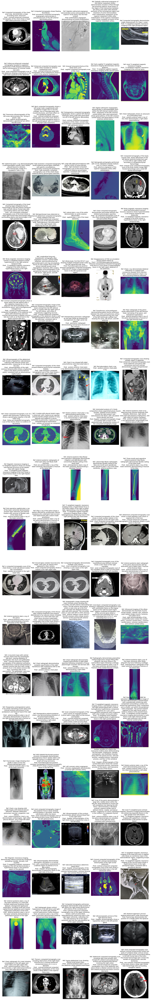

In [27]:
plot_results(results_df, num_images=100)